In [ ]:
!nvidia-smi

Sat Mar 15 16:06:46 2025       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.54.15              Driver Version: 550.54.15      CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   65C    P8             13W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [ ]:
!pip install -q "git+https://github.com/THU-MIG/yoloe.git#subdirectory=third_party/CLIP"
!pip install -q "git+https://github.com/THU-MIG/yoloe.git#subdirectory=third_party/ml-mobileclip"
!pip install -q "git+https://github.com/THU-MIG/yoloe.git#subdirectory=third_party/lvis-api"
!pip install -q "git+https://github.com/THU-MIG/yoloe.git"

!pip install -q supervision jupyter_bbox_widget

!wget -q https://docs-assets.developer.apple.com/ml-research/datasets/mobileclip/mobileclip_blt.pt


  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 69.4/69.4 kB 6.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.2/2.2 MB 61.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 65.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 181.5/181.5 kB 1.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 220.8/220.8 kB 21.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 765.5/765.5 kB 51.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 68.3 MB/s eta 0:00:00


# Pull weights

In [ ]:
from huggingface_hub import hf_hub_download

path = hf_hub_download(repo_id="jameslahm/yoloe", filename="yoloe-v8l-seg.pt", local_dir='.')
path = hf_hub_download(repo_id="jameslahm/yoloe", filename="yoloe-v8l-seg-pf.pt", local_dir='.')

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


yoloe-v8l-seg.pt:   0%|          | 0.00/107M [00:00<?, ?B/s]

yoloe-v8l-seg-pf.pt:   0%|          | 0.00/103M [00:00<?, ?B/s]

#Download example data

#If you want to run the cookbook using your own file as input, simply upload video to Google Colab and replace SOURCE_IMAGE_PATH and SOURCE_VIDEO_PATH with the path to your file.

In [ ]:
!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

!wget -q https://media.roboflow.com/supervision/video-examples/croissant-1280x720.mp4
!wget -q https://media.roboflow.com/supervision/video-examples/suitcases-1280x720.mp4
!wget -q https://media.roboflow.com/supervision/video-examples/factory-1280x720.mp4

# Text prompt for image processiong

In [ ]:
!ls

croissant-1280x720.mp4	dog-4.jpeg  dog-7.jpeg	factory-1280x720.mp4  suitcases-1280x720.mp4
dog-2.jpeg		dog-5.jpeg  dog-8.jpeg	mobileclip_blt.pt     yoloe-v8l-seg-pf.pt
dog-3.jpeg		dog-6.jpeg  dog.jpeg	sample_data	      yoloe-v8l-seg.pt


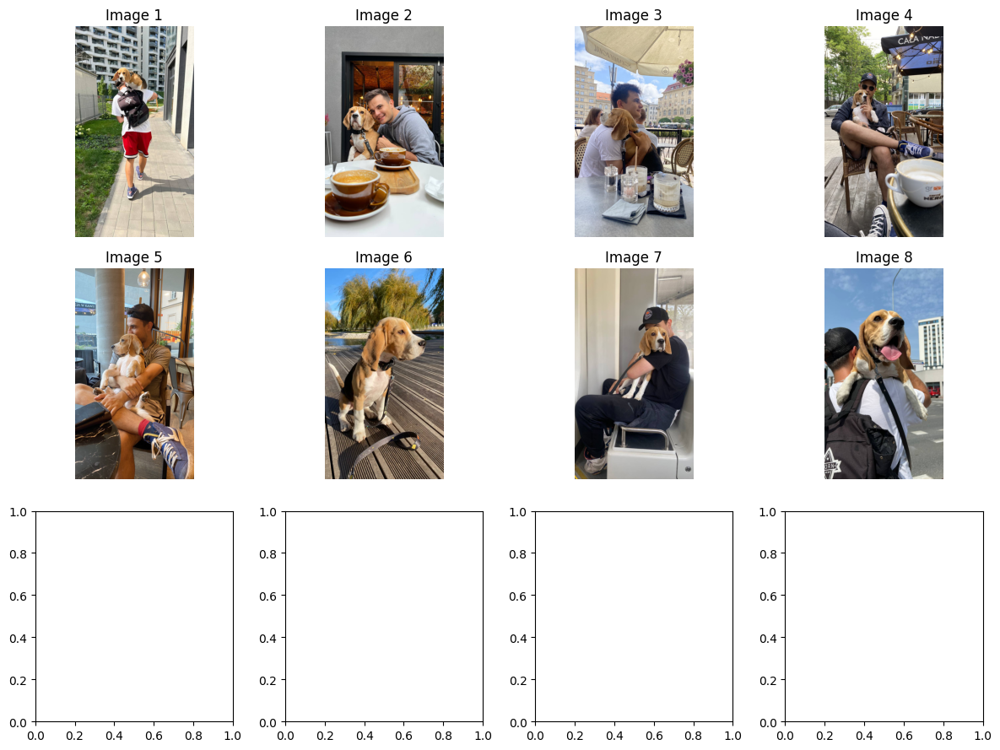

In [ ]:
import matplotlib.pyplot as plt
import cv2

# List of image file paths
image_paths = [
    "dog-4.jpeg", "dog-7.jpeg", "dog-2.jpeg",
    "dog-3.jpeg", "dog-5.jpeg", "dog-6.jpeg", # Changed "dog-5.jpeg.jpg" to "dog-5.jpeg"
    "dog-8.jpeg", "dog.jpeg"
]

# Create a figure
fig, axes = plt.subplots(3, 4, figsize=(12, 9))  # 3 rows, 4 columns (extra space for 11 images)

for i, ax in enumerate(axes.flat):
    if i < len(image_paths):  # Ensure we don't access out-of-range
        img = cv2.imread(image_paths[i])
        if img is not None: # Check if image was loaded successfully
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR (OpenCV) to RGB (Matplotlib)
            ax.imshow(img)
            ax.set_title(f"Image {i+1}")
            ax.axis("off")  # Hide axes
        else:
            print(f"Failed to load image: {image_paths[i]}") # Print a message if image loading fails

# Remove extra empty subplots (if any)
for j in range(i+1, len(axes.flat)):
    fig.delaxes(axes.flat[j])

plt.tight_layout()
plt.show()

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Build text model mobileclip:blt


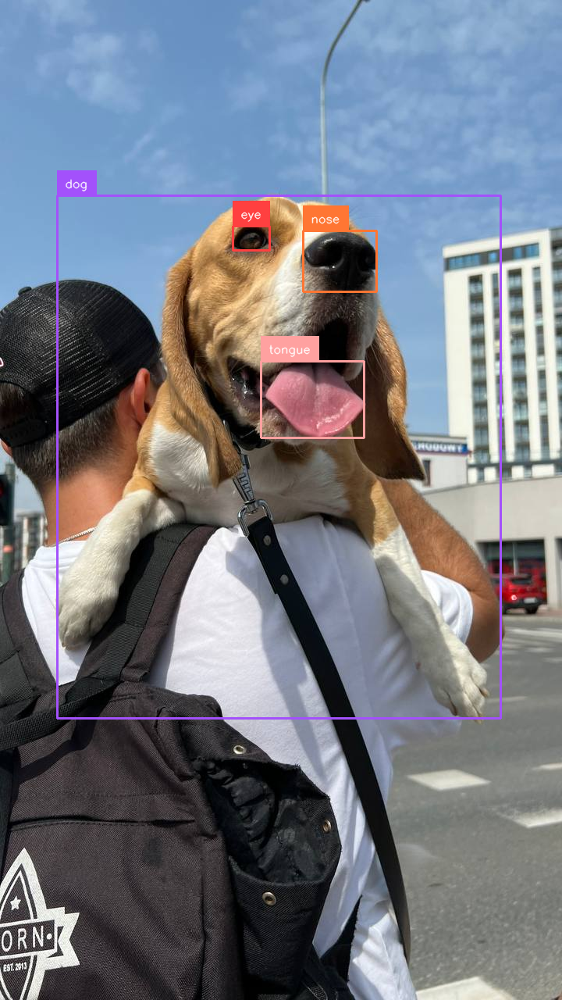

In [ ]:
import supervision as sv
from ultralytics import YOLOE
from PIL import Image

IMAGE_PATH = "dog.jpeg"
NAMES = ["dog", "eye", "tongue", "nose", "ear"]

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

image = Image.open(IMAGE_PATH)
results = model.predict(image, conf=0.1, verbose=False)

detections = sv.Detections.from_ultralytics(results[0])

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

annotated_image

Build text model mobileclip:blt


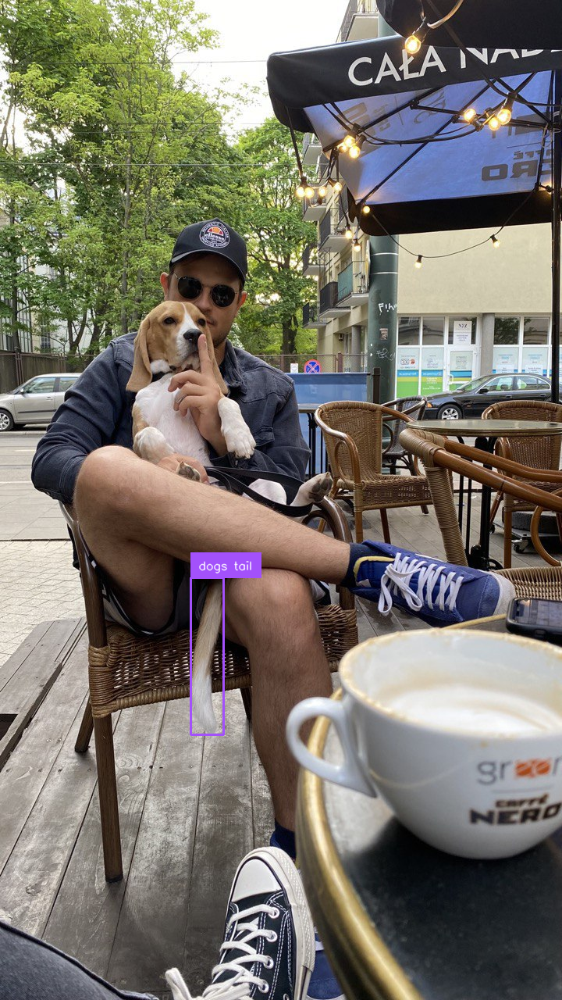

In [ ]:
import supervision as sv
from ultralytics import YOLOE
from PIL import Image

IMAGE_PATH = "dog-3.jpeg"
NAMES = ["dogs tail"]

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

image = Image.open(IMAGE_PATH)
results = model.predict(image, conf=0.1, verbose=False)
detections = sv.Detections.from_ultralytics(results[0])

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

annotated_image

Build text model mobileclip:blt


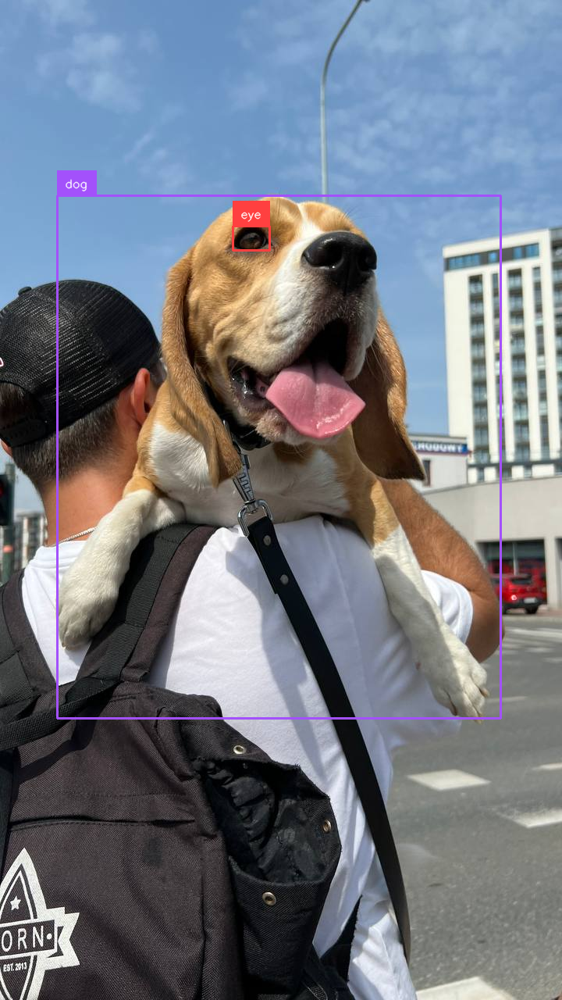

In [ ]:
# prompt: i want dogs eye write a code

IMAGE_PATH = "dog.jpeg"
NAMES = ["dog", "eye"] # Only look for dogs and eyes

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

image = Image.open(IMAGE_PATH)
results = model.predict(image, conf=0.1, verbose=False)

detections = sv.Detections.from_ultralytics(results[0])

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

annotated_image


Build text model mobileclip:blt


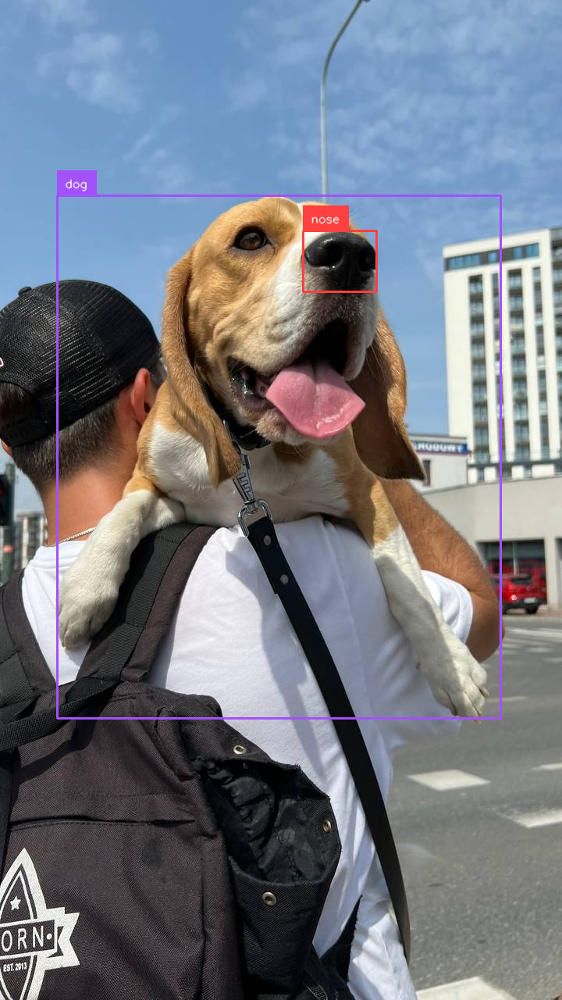

In [ ]:
# prompt: i want dogs eye write a code

IMAGE_PATH = "dog.jpeg"
NAMES = ["dog", "nose"] # Only look for dogs and eyes

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

image = Image.open(IMAGE_PATH)
results = model.predict(image, conf=0.1, verbose=False)

detections = sv.Detections.from_ultralytics(results[0])

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

annotated_image


Build text model mobileclip:blt


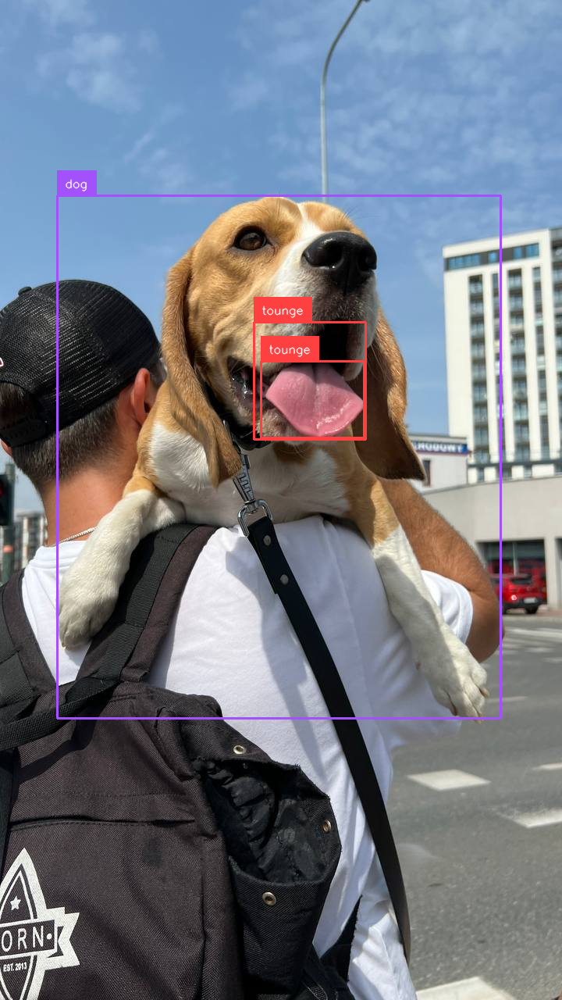

In [ ]:
# prompt: i want dogs eye write a code

IMAGE_PATH = "dog.jpeg"
NAMES = ["dog", "tounge"] # Only look for dogs and eyes

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

image = Image.open(IMAGE_PATH)
results = model.predict(image, conf=0.1, verbose=False)

detections = sv.Detections.from_ultralytics(results[0])

annotated_image = image.copy()
annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

annotated_image


In [ ]:
!pip install ultralytics supervision opencv-python pillow torch torchvision


Build text model mobileclip:blt

0: 640x640 1 cap, 1 dog, 73.5ms
Speed: 3.6ms preprocess, 73.5ms inference, 2.6ms postprocess per image at shape (1, 3, 640, 640)


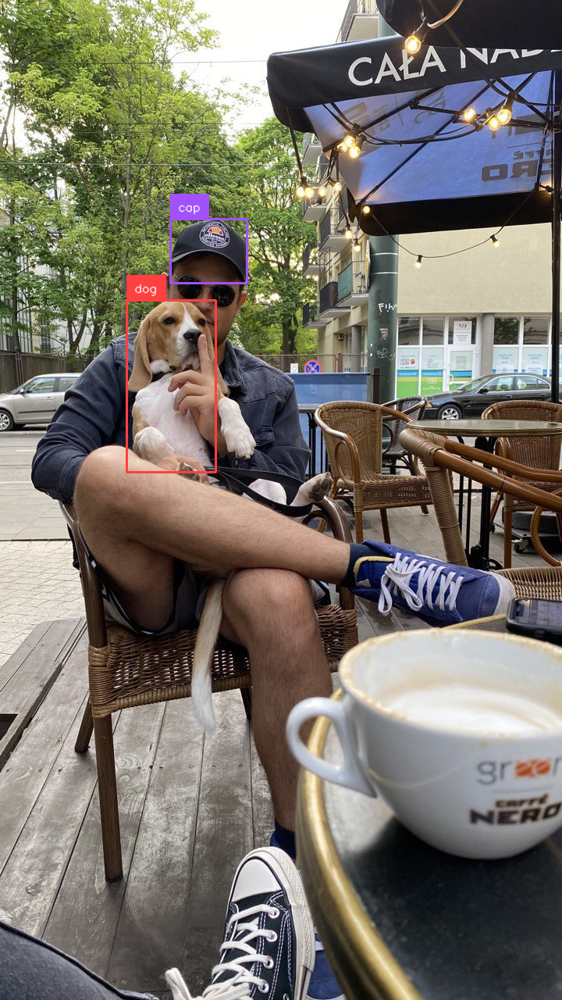

In [ ]:

import numpy as np
from ultralytics import YOLOE
from ultralytics.models.yolo.yoloe.predict_vp import YOLOEVPSegPredictor
import supervision as sv
import cv2
from PIL import Image
import torch
# Import the necessary patch for cv2_imshow
from google.colab.patches import cv2_imshow

# Load YOLOE model
model = YOLOE("yoloe-v8l-seg.pt").cuda()  # Use GPU if available

# Define class names
NAMES = ["cap","dog"]  # Modify as needed

# Get text embeddings for the classes
embeddings = model.get_text_pe(NAMES) #Added this line to get the embeddings

# Set the classes and their embeddings in the model
model.set_classes(NAMES, embeddings) #Added embeddings as an argument

# Load source image
SOURCE_IMAGE_PATH = "dog-3.jpeg"  # Change to your image path
image = Image.open(SOURCE_IMAGE_PATH)

# Perform prediction
results = model.predict(image)

# Convert results to Supervision detections
detections = sv.Detections.from_ultralytics(results[0])

# Create annotators
box_annotator = sv.BoxAnnotator()
label_annotator = sv.LabelAnnotator()

# Load image for annotation
annotated_image = image.copy()

# Annotate with bounding boxes and labels
annotated_image = box_annotator.annotate(scene=annotated_image, detections=detections)
annotated_image = label_annotator.annotate(scene=annotated_image, detections=detections)

# Convert PIL Image to OpenCV format
annotated_image = cv2.cvtColor(np.array(annotated_image), cv2.COLOR_RGB2BGR)

# Save or Display Image
cv2.imwrite("output.jpg", annotated_image)
# Use cv2_imshow instead of cv2.imshow
cv2_imshow(annotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()

# Text prompt for video processiong

In [ ]:
import supervision as sv
from ultralytics import YOLOE
from PIL import Image
from tqdm import tqdm

SOURCE_VIDEO_PATH = "suitcases-1280x720.mp4"
TARGET_VIDEO_PATH = "suitcases-1280x720-result.mp4"
NAMES = ["suitcase"]

model = YOLOE("yoloe-v8l-seg.pt").cuda()
model.set_classes(NAMES, model.get_text_pe(NAMES))

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

# visualize video frames sample in notebook
frames = []
frame_interval = 10

with sv.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
    for index, frame in enumerate(tqdm(frame_generator)):
        results = model.predict(frame, conf=0.1, verbose=False)
        detections = sv.Detections.from_ultralytics(results[0])

        annotated_image = frame.copy()
        annotated_image = sv.ColorAnnotator().annotate(scene=annotated_image, detections=detections)
        annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
        annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

        sink.write_frame(annotated_image)

        # visualize video frames sample in notebook
        if index % frame_interval == 0:
            frames.append(annotated_image)

Build text model mobileclip:blt


1249it [01:32, 13.43it/s]


# Visual prompt for video processiong

In [ ]:
import base64
import cv2

def encode_numpy_image(img):
    success, encoded_image = cv2.imencode('.jpg', img)
    if not success:
        raise ValueError("Could not encode image to JPEG format.")

    base64_bytes = base64.b64encode(encoded_image)
    base64_str = base64_bytes.decode('utf-8')

    return f"data:image/jpg;base64,{base64_str}"

In [ ]:
IS_COLAB = True
SOURCE_VIDEO_PATH = "croissant-1280x720.mp4"
TARGET_VIDEO_PATH = "croissant-1280x720-result.mp4"
NAMES = ["croissant"]

frame_generator = sv.get_video_frames_generator(SOURCE_VIDEO_PATH)
frame = next(frame_generator)

if IS_COLAB:
    from google.colab import output
    output.enable_custom_widget_manager()

from jupyter_bbox_widget import BBoxWidget

widget = BBoxWidget(classes=NAMES)
widget.image = encode_numpy_image(frame)
widget

BBoxWidget(classes=['croissant'], colors=['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b', '#…

In [ ]:
widget.bboxes

[{'x': 510, 'y': 235, 'width': 581, 'height': 225, 'label': 'croissant'},
 {'x': 209, 'y': 422, 'width': 0, 'height': 0, 'label': 'croissant'}]

In [ ]:
import numpy as np

default_box = [
    {'x': 530, 'y': 246, 'width': 517, 'height': 221, 'label': 'croissant'}
]

boxes = widget.bboxes if widget.bboxes else default_box
bboxes = np.array([
    [
        box['x'],
        box['y'],
        box['x'] + box['width'],
        box['y'] + box['height']
    ] for box in boxes
], dtype=np.float64)

cls = np.array([NAMES.index(box['label']) for box in boxes], dtype=np.int32)

In [ ]:
%%time

from ultralytics import YOLOE
from ultralytics.models.yolo.yoloe.predict_vp import YOLOEVPSegPredictor

model = YOLOE("yoloe-v8l-seg.pt").cuda()
prompts = dict(bboxes=bboxes, cls=cls)

model.predict(frame, prompts=prompts, predictor=YOLOEVPSegPredictor, return_vpe=True)
model.set_classes(NAMES, model.predictor.vpe)
model.predictor = None

video_info = sv.VideoInfo.from_video_path(SOURCE_VIDEO_PATH)

# visualize video frames sample in notebook
frames = []
frame_interval = 10

with sv.VideoSink(TARGET_VIDEO_PATH, video_info) as sink:
    for index, frame in enumerate(tqdm(frame_generator)):

        results = model.predict(frame, verbose=False)
        detections = sv.Detections.from_ultralytics(results[0])

        annotated_image = frame.copy()
        annotated_image = sv.ColorAnnotator().annotate(scene=annotated_image, detections=detections)
        annotated_image = sv.BoxAnnotator().annotate(scene=annotated_image, detections=detections)
        annotated_image = sv.LabelAnnotator().annotate(scene=annotated_image, detections=detections)

        sink.write_frame(annotated_image)

        # visualize video frames sample in notebook
        if index % frame_interval == 0:
            frames.append(annotated_image)


0: 640x640 (no detections), 155.7ms
Speed: 4.3ms preprocess, 155.7ms inference, 0.5ms postprocess per image at shape (1, 3, 640, 640)


0it [00:00, ?it/s]

CPU times: user 367 ms, sys: 38.8 ms, total: 405 ms
Wall time: 401 ms
